# Restaurant Data Analysis

This project analyzes a restaurant dataset contained in "Restaurant.xlsx". The dataset likely includes information about restaurant names, locations, cuisines, prices, ratings, and other attributes relevant to food and hospitality. The primary aim is to extract useful insights and patterns relating to restaurant operations, customer preferences, and performance indicators

File Name : Restaurant.xlsx

Data Source : https://drive.google.com/file/d/1rGhBGoFJNWQ1HkFQLh06gIHZA7HaDtI7/view?usp=drive_link

# Data Exploration

## Importing required Python Libraries

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

## Importing Dataset

In [8]:
Restaurant = pickle.load(open("Restaurant.pkl", "rb"))

In [9]:
Restaurant.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


# Level 2

### Task : 1 Restaurant Ratings

Evaluating restaurant ratings and vote counts provides essential insights into customer satisfaction and engagement within the food service industry. By examining how aggregate ratings are distributed, we can identify common perceptions of restaurant quality and pinpoint the most frequently occurring rating ranges. Additionally, investigating the average number of votes received by restaurants helps measure customer interaction and popularity.

In this task, we will analyze the distribution of aggregate ratings to determine the most prevalent rating range and calculate the average number of votes received by restaurants. This analysis supports effective benchmarking, highlights performance trends, and guides quality improvement strategies for businesses seeking to enhance their reputation and attract more customers.

### Task : 1.1 Analyze the distribution of aggregate ratings and determine the most common rating range.

In [14]:
# Count how many restaurants have each rating

Rating_Counts = Restaurant['Aggregate rating'].value_counts().sort_index()

# Create a DataFrame table (formatted for direct display)

Rating_Counts_Table = Rating_Counts.reset_index()
Rating_Counts_Table.columns = ['Rating', 'Counts']

# Display as a regular DataFrame table

Rating_Counts_Table = Rating_Counts_Table.sort_values('Counts', ascending = False)
Rating_Counts_Table

,Rating,Counts
0,0.0,2148
15,3.2,522
14,3.1,519
17,3.4,495
16,3.3,483
18,3.5,480
13,3.0,468
19,3.6,458
20,3.7,427
21,3.8,399


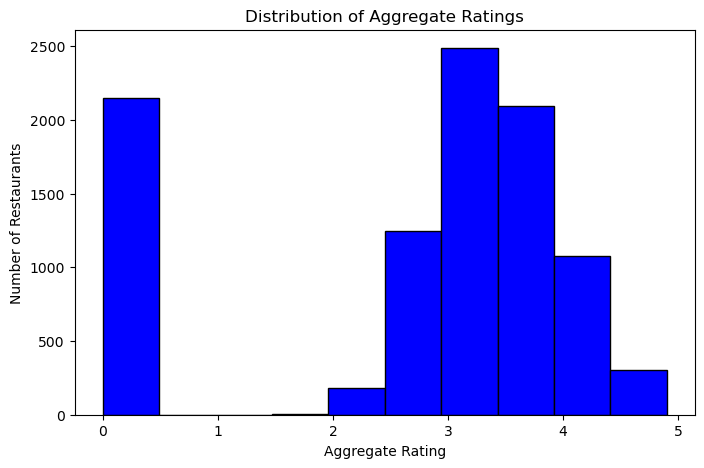

In [15]:
# Plot a histogram to see how ratings are distributed

plt.figure(figsize = (8,5))
plt.hist(Restaurant['Aggregate rating'] , bins = 10 , color = 'blue' , edgecolor = 'black')

plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Number of Restaurants')

plt.show()

In [16]:
# Most common aggregate rating

Most_Common_Rating = Restaurant['Aggregate rating'].mode()[0]
print("\nThe Most Common Aggregate rating is:" , Most_Common_Rating , "\n")

# Divide ratings into ranges

Rating_Bins = pd.cut(Restaurant['Aggregate rating'], bins = [0, 1, 2, 3, 4, 5])

# Count restaurants in each range and create DataFrame

Rating_Table = Rating_Bins.value_counts().reset_index()
Rating_Table.columns = ['Rating Range', 'Counts']

# Display as a regular table (not using print)

print("\nNumber of Restaurants in each rating range \n")
Rating_Table


The Most Common Aggregate rating is: 0.0 


Number of Restaurants in each rating range 



,Rating Range,Counts
0,"(3, 4]",4381
1,"(2, 3]",1891
2,"(4, 5]",1112
3,"(1, 2]",10
4,"(0, 1]",0


### Understanding

Most Restaurants in the dataset have an Aggregate Rating of 0.0 due to missing or unrated entries. Among the rated restaurants, The Most Common Rating Range is between 3.0 and 4.0 indicating that the majority of customers give average to slightly above-average ratings.

### Task : 1.2 Calculate the average number of votes received by restaurants

In [19]:
# Calculate the average number of votes

AVG_Vote = Restaurant['Votes'].mean().round(2)
print("\nAverage number of Votes are : " , AVG_Vote , "\n")


Average number of Votes are :  156.77 



### Understanding

On average, each restaurant has received around 157 customer votes.
It indicates a moderate level of customer engagement across restaurants; some restaurants may have a high number of votes due to popularity, while many others may have fewer votes, balancing the overall mean.

### Task 2 : Cuisine Combination

Restaurants increasingly offer meals that blend diverse culinary traditions, resulting in unique and appealing cuisine combinations. Studying which cuisine pairs or groups are most common helps reveal consumer preferences, highlight popular fusion trends, and inform innovative menu planning.

In this task, we aim to identify the most frequent cuisine combinations present in the dataset. Further, we will analyze if particular combinations are associated with higher restaurant ratings. This investigation provides valuable insights into emerging food trends, supports the creation of appealing dining experiences, and helps restaurants differentiate themselves in a competitive market.

### Task : 2.1 Analyze the distribution of aggregate ratings and determine the most common rating range.

In [24]:
# Assuming Restu is your cleaned DataFrame with the 'Cuisines' column processed

Common_Cuisines = Restaurant['Cuisines'].value_counts().head()

# Convert the result to a DataFrame and rename columns for clarity

Common_Cuisines_Table = Common_Cuisines.reset_index()
Common_Cuisines_Table.columns = ['Cuisine Combination' , 'Counts']

# Display as a regular DataFrame table

print("Most Common Cuisine Combinations: \n\n")
Common_Cuisines_Table

Most Common Cuisine Combinations: 




,Cuisine Combination,Counts
0,North Indian,936
1,"North Indian, Chinese",511
2,Chinese,354
3,Fast Food,354
4,"North Indian, Mughlai",334


### Understanding

North Indian cuisine is the most commonly offered cuisine, with 936 restaurants serving it.

North Indian and Chinese is the most popular cuisine combination, indicating that many restaurants offer a blended menu to attract a wider customer base.

Chinese and Fast Food individually also appear frequently, showing strong demand for both traditional and quick-service food categories.

Overall, the dataset reveals that customers have a strong preference for North Indian and Chinese cuisines, either individually or in combination.

### Task : 2.2 Determine if certain cuisine combinations tend to have higher ratings.

In [27]:
# Group by 'Cuisines' and calculate average of 'Aggregate rating'

Average_Ratings = Restaurant.groupby('Cuisines')['Aggregate rating'].mean()

# Sort the results by average rating (from highest to lowest)

Sorted_Ratings = Average_Ratings.sort_values(ascending = False)

# Convert the result to a DataFrame and rename columns for clarity

Sorted_Ratings_Table = Sorted_Ratings.reset_index()
Sorted_Ratings_Table.columns = ['Cuisine Combination', 'Average Rating']

# Display the table (top 5 combinations)

print("Cuisine Combinations with the Highest Average Ratings\n")
Sorted_Ratings_Table.head()

Cuisine Combinations with the Highest Average Ratings



,Cuisine Combination,Average Rating
0,"Italian, Deli",4.9
1,"Hawaiian, Seafood",4.9
2,"American, Sandwich, Tea",4.9
3,"Continental, Indian",4.9
4,"European, Asian, Indian",4.9


### Understanding

Certain cuisine combinations, particularly those involving international or fusion styles tend to have the highest customer ratings, indicating stronger customer preference and satisfaction for these culinary offerings.

### Task : 3 Geographic Analysis

Geographic visualization provides powerful insights into the spatial distribution of restaurants, revealing patterns that may influence business strategy, customer accessibility, and regional market opportunities. By plotting restaurant locations on a map using longitude and latitude coordinates, we can visually assess the concentration and spread of establishments within a given area.

In this task, we will map the locations of restaurants in the dataset to identify spatial patterns and clusters in specific regions. This analysis enables the identification of dining hotspots, uncovers underserved areas, and supports data-driven decisions for restaurant expansion, marketing focus, and urban planning.

### Task : 3.1 Plot the locations of restaurants on a map using longitude and latitude coordinates.

In [32]:
# Display the table with restaurant name, latitude, and longitude

Location_Table = Restaurant[['Restaurant Name', 'Latitude', 'Longitude']]
Location_Table

,Restaurant Name,Latitude,Longitude
0,Le Petit Souffle,14.565443,121.027535
1,Izakaya Kikufuji,14.553708,121.014101
2,Heat - Edsa Shangri-La,14.581404,121.056831
3,Ooma,14.585318,121.056475
4,Sambo Kojin,14.584450,121.057508
...,...,...,...
9546,Namlı Gurme,41.022793,28.977392
9547,Ceviz Ağacı,41.009847,29.041297
9548,Huqqa,41.055817,29.034640
9549,Açık Kahve,41.057979,29.036019


In [33]:
# Install Folium

!pip install folium

In [34]:
# Plot the locations of restaurants on a map using longitude and latitude coordinates.

import folium

# Set map center to the first restaurant's coordinates
Map_Center = [Restaurant['Latitude'].iloc[0], Restaurant['Longitude'].iloc[0]]
Restaurant_Map = folium.Map(location = Map_Center, zoom_start = 12)

# Add each restaurant as a marker on the map
for IDX, Row in Restaurant.iterrows():
    folium.Marker(
        location = [Row['Latitude'], Row['Longitude']],
        popup = Row['Restaurant Name'] if 'Restaurant Name' in Restaurant.columns else f'Restaurant {IDX + 1}'
    ).add_to(Restaurant_Map)

Restaurant_Map

### Task : 3.2 Identify any patterns or clusters of restaurants in specific areas.

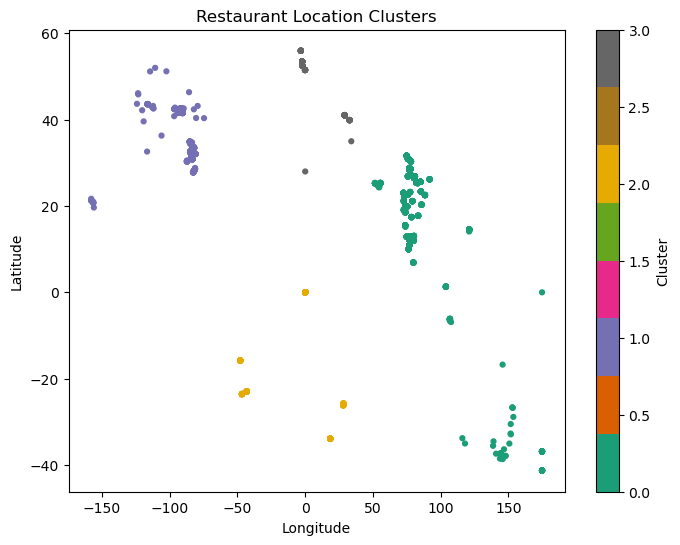

In [36]:
# Importing Kmean Algorithm

from sklearn.cluster import KMeans

# Number of clusters

Num_Clusters = 4

# Coordinates

Coords = Restaurant[['Latitude', 'Longitude']]

# Fit KMeans and create cluster column

kmeans = KMeans(n_clusters = Num_Clusters, random_state = 0)
Restaurant['Cluster'] = kmeans.fit_predict(Coords)

plt.figure(figsize = (8, 6))

plt.scatter(
    Restaurant['Longitude'],
    Restaurant['Latitude'],
    c = Restaurant['Cluster'],     
    cmap = 'Dark2',          
    s = 12                   
)

plt.title("Restaurant Location Clusters")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.colorbar(label = "Cluster")   
plt.show()

### Task : 4 Restaurant Chains 

Restaurant chains play a significant role in the food service industry, often shaping consumer perceptions of consistency, quality, and brand reliability. Identifying the presence of restaurant chains within a dataset provides insights into market structure and business strategies in the region.

In this task, we will determine if any restaurant chains exist in the dataset and analyze their ratings and popularity. This examination will help assess the performance and customer appeal of chains compared to independent restaurants, offering valuable information for benchmarking, competitive analysis, and strategic growth planning.

### Task : 4.1 Identify if there are any restaurant chains present in the dataset.

In [40]:
# Count occurrences of each restaurant name

Restaurant_Name_Count = Restaurant['Restaurant Name'].value_counts()

# Find restaurants with more than one location (possible chains)

Chain = Restaurant_Name_Count[Restaurant_Name_Count > 1]

# Convert to DataFrame and rename columns for clarity

Chain_Table = Chain.reset_index()
Chain_Table.columns = ['Restaurant Name', 'Location Counts']

print("Possible Restaurant Chains and their Location counts:\n")
Chain_Table

Possible Restaurant Chains and their Location counts:



,Restaurant Name,Location Counts
0,Café Coffee Day,83
1,Domino's Pizza,79
2,Subway,63
3,Green Chick Chop,51
4,McDonald's,48
...,...,...
730,Tandoori Tadka,2
731,Green Leaf,2
732,The Belgian Fries Company,2
733,Chawla Family Restaurant,2


### Understanding

Café Coffee Day, Domino’s Pizza, and Subway have established outlets in almost every location.

### Task : 4.2 Analyze the ratings and popularity of different restaurant chains.

In [63]:
# Group by Restaurant Name and aggregate rating, total votes, and number of locations

Chain_Group = Restaurant.groupby('Restaurant Name').agg({
    'Aggregate rating': 'mean',
    'Votes': 'sum',
    'Restaurant Name': 'count'  # Number of locations
}).rename(columns = {'Restaurant Name': 'Location_count'})

# Only keep chains (locations > 1)

Chains_Only = Chain_Group[Chain_Group['Location_count'] > 1]

# Sort chains by highest average rating

Top_Rated_Chains = Chains_Only.sort_values(by = 'Aggregate rating', ascending = False)


# Top chains by average rating

Top_Rated_Chains_Table = Top_Rated_Chains.reset_index()[['Restaurant Name', 'Aggregate rating', 'Votes', 'Location_count']]
Top_Rated_Chains_Table.columns = ['Restaurant Name', 'Average Rating', 'Total Votes', 'Location Count']

print("\nTop Restaurant Chains by Average Rating:\n")
display(Top_Rated_Chains_Table.head(10))


# Most popular chains by votes

Most_Popular_Chains = Chains_Only.sort_values(by = 'Votes' , ascending = False)
Most_Popular_Chains_Table = Most_Popular_Chains[['Aggregate rating', 'Votes', 'Location_count']].reset_index()
print("\nMost Popular Restaurant Chains by Number of Votes:\n")
Most_Popular_Chains_Table.head(10)


Top Restaurant Chains by Average Rating:



,Restaurant Name,Average Rating,Total Votes,Location Count
0,Talaga Sampireun,4.900,5514,3
1,Silantro Fil-Mex,4.850,1364,2
2,AB's Absolute Barbecues,4.850,3151,2
3,AB's - Absolute Barbecues,4.825,13400,4
4,Naturals Ice Cream,4.800,3094,2
5,Gymkhana,4.700,328,2
6,The Cheesecake Factory,4.650,3010,2
7,Garota de Ipanema,4.600,59,2
8,Dishoom,4.600,1269,2
9,Chili's,4.580,8156,5



Most Popular Restaurant Chains by Number of Votes:



,Restaurant Name,Aggregate rating,Votes,Location_count
0,Barbeque Nation,4.353846,28142,26
1,AB's - Absolute Barbecues,4.825000,13400,4
2,Big Chill,4.475000,10853,4
3,Farzi Café,4.366667,10098,6
4,Truffles,3.950000,9682,2
5,Chili's,4.580000,8156,5
6,Joey's Pizza,4.250000,7807,2
7,Big Yellow Door,4.266667,7511,3
8,Saravana Bhavan,4.133333,7238,3
9,Starbucks,3.805556,7139,18


# Understanding

The analysis shows that some chains have the highest ratings, while others have the most votes, meaning they are the most popular. Highly rated chains provide great quality, and chains with high votes have strong customer demand. Overall, this helps identify which restaurant chains are best in quality and popularity.

# Conclusion

The restaurant dataset analysis highlights distinct patterns in customer behavior, cuisine choices, location concentration, and the role of large chains. Most restaurants receive average ratings between 3.0 and 4.0, with North Indian and Chinese emerging as the dominant cuisines, both separately and when served together. Spatial analysis shows that restaurants are heavily clustered in a few high-density regions.

The data also includes several prominent chains, with Café Coffee Day, Domino’s, and Subway appearing across many locations. Performance review of these chains indicates that some brands achieve strong customer satisfaction through higher ratings, while others are more notable for their popularity, reflected in a greater number of votes. Taken together, the findings offer useful insights into overall restaurant quality, customer preferences, and the competitive structure of the market.